# (Flight Delay and Cancelation Analysis)
## by (Ahmed Hashem)

## Investigation Overview

> We need to elaborate the reasons for flight delays and the main impacted trips

## Dataset Overview

> This dataset reports flights in the United States, including carriers, arrival and departure delays, and reasons for delays, from 2003 to 2008.

In [3]:
# import all packages and set plots to be embedded inline
import pandas as pd
import numpy as np
import random
import os
import matplotlib.pyplot as plt
import seaborn as sb
sb.set_style('white')
sb.set_palette('Set2')
base_color = "#00508e"
title_font_dict = {'fontsize':18,
                  'fontweight':'bold'}
labels_font_dict={'fontsize':14}
%matplotlib inline

# suppress warnings from final output
import warnings
warnings.simplefilter("ignore")

In [4]:
# load in the dataset into a pandas dataframe
filename = ["2003.csv","2004.csv","2005.csv","2006.csv","2007.csv","2008.csv",]
for file in filename:
    n = sum(1 for line in open(file)) - 1 #number of records in file (excludes header)
    s = 10000 #desired sample size
    skip = sorted(random.sample(range(1,n+1),n-s)) #the 0-indexed header will not be included in the skip list
    if file =="2003.csv":
        df03 = pd.read_csv(file, skiprows=skip,encoding="ascii")
    if file  =="2004.csv":
        df04 = pd.read_csv(file, skiprows=skip,encoding="ascii")
    if file == "2005.csv":
        df05 = pd.read_csv(file, skiprows=skip,encoding="ascii")
    if file  =="2006.csv":
        df06 = pd.read_csv(file, skiprows=skip,encoding="ascii")
    if file  =="2007.csv":
        df07 = pd.read_csv(file, skiprows=skip,encoding="ascii")
    else:
        df08 = pd.read_csv(file, skiprows=skip,encoding="ascii")
df=df03.append([df04,df05,df06,df07,df08])      

> Note that the above cells have been set as "Skip"-type slides. That means
that when the notebook is rendered as http slides, those cells won't show up.

## (Flight Timing)

> Rarely found any trips from midnight to 5 AM

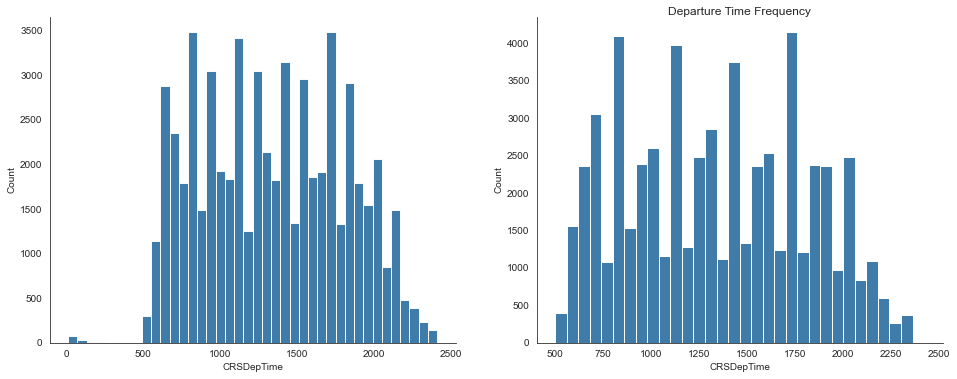

In [15]:
fig, ax = plt.subplots(figsize=(16, 6), ncols=2)

sb.histplot(df.CRSDepTime, kde=False, color=base_color, binwidth=60, ax=ax[0])
sb.despine()
plt.title('Departure Time Frequency',pad=1.5)
sb.histplot(df.CRSDepTime, kde=False, color=base_color, binwidth=60, ax=ax[1], binrange=[500, 2400])
sb.despine()

## (Cancelation Reasons)

> Carrier was the most frequent reason for cancellation

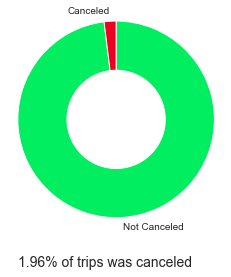

In [23]:
canceled_df = df.Cancelled.value_counts()

plt.pie(canceled_df,
       labels = ['Not Canceled', 'Canceled'],
       startangle=90,
       counterclock=False,
       wedgeprops={'width': 0.5},
       colors=['#00ee60', '#ee0020'])
plt.axis('square')
plt.text(-1, -1.5, f'{canceled_df[1]/canceled_df.sum():.2%} of trips was canceled', fontdict={'fontsize': 14})
plt.show()

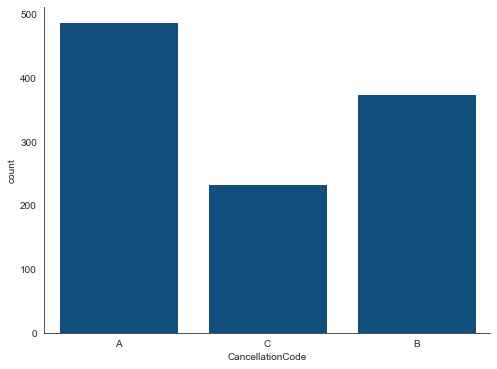

In [6]:
fig, ax = plt.subplots(figsize=(8, 6))

sb.countplot(data=df, x='CancellationCode', color=base_color, ax=ax)
sb.despine()

## Top 10 Trips (Origin-Destination) with delaysover years



In [19]:
#Using Feture Engineering to add trip coloumn to measure the hall trip Origin-Destination impact:
df["trip"]=df["Origin"]+"-"+df["Dest"]

#Adding Total Delay for all Delay Categories
df['TotalDelay']=df[['CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay']].sum(axis=1, min_count=1)

In [20]:
trip_groups_years=df[['Year','trip','CarrierDelay','WeatherDelay','NASDelay','SecurityDelay','TotalDelay']]\
                                                             .groupby(['Year','trip']).median().reset_index()
trip_groups_years

,Year,trip,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,TotalDelay
0,2003,ABE-ATL,NaN,NaN,NaN,NaN,NaN
1,2003,ABE-CLE,0.0,0.0,0.0,0.0,0.0
2,2003,ABE-ORD,0.0,0.0,0.0,0.0,0.0
3,2003,ABI-DFW,0.0,0.0,0.0,0.0,0.0
4,2003,ABQ-AMA,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...
18566,2008,XNA-ORD,NaN,NaN,NaN,NaN,NaN
18567,2008,YKM-SLC,23.0,0.0,0.0,0.0,23.0
18568,2008,YUM-IPL,NaN,NaN,NaN,NaN,NaN
18569,2008,YUM-LAX,NaN,NaN,NaN,NaN,NaN


## Bivariate Exploration

> To start off with, I want to look at the pairwise correlations present between features in the data.

In [21]:
#Using Feture Engineering to add trip coloumn to measure the hall trip Origin-Destination impact:
df["trip"]=df["Origin"]+"-"+df["Dest"]

#Adding Total Delay for all Delay Categories
df['TotalDelay']=df[['CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay']].sum(axis=1, min_count=1)

In [22]:
np.nan + 10

nan

In [25]:
trip_groups=df[['trip','CarrierDelay','WeatherDelay','NASDelay','SecurityDelay','TotalDelay']].groupby('trip').mean()
trip_groups

,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,TotalDelay
trip,,,,,
ABE-ATL,NaN,30.500000,53.666667,NaN,55.500000
ABE-CLE,NaN,NaN,NaN,NaN,NaN
ABE-CLT,NaN,NaN,NaN,NaN,NaN
ABE-CVG,11.000000,NaN,8.000000,NaN,19.000000
ABE-DTW,NaN,NaN,17.000000,NaN,17.000000
ABE-IAD,NaN,NaN,NaN,NaN,NaN
ABE-ORD,NaN,NaN,NaN,NaN,NaN
ABE-PHL,NaN,NaN,NaN,NaN,NaN
ABI-DFW,NaN,137.000000,86.000000,NaN,223.000000


In [27]:
trip_groups = trip_groups.reset_index()
trip_groups.columns = ['trip','CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay','TotalDelay']

In [28]:
trip_groups = trip_groups.dropna(axis=0, how='all')
trip_groups

,trip,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,TotalDelay
0,ABE-ATL,NaN,30.500000,53.666667,NaN,55.500000
1,ABE-CLE,NaN,NaN,NaN,NaN,NaN
2,ABE-CLT,NaN,NaN,NaN,NaN,NaN
3,ABE-CVG,11.000000,NaN,8.000000,NaN,19.000000
4,ABE-DTW,NaN,NaN,17.000000,NaN,17.000000
5,ABE-IAD,NaN,NaN,NaN,NaN,NaN
6,ABE-ORD,NaN,NaN,NaN,NaN,NaN
7,ABE-PHL,NaN,NaN,NaN,NaN,NaN
8,ABI-DFW,NaN,137.000000,86.000000,NaN,223.000000
9,ABI-IAH,NaN,NaN,NaN,NaN,NaN


In [29]:
#Carrier Delays Top 10 Trips
carrier_delays_10=trip_groups.sort_values('CarrierDelay',ascending=False)[:10][['trip', 'CarrierDelay']]
carrier_delays_10

,trip,CarrierDelay
4065,SAT-MEM,1057.0
4005,SAN-CLE,679.0
4721,TYS-DFW,659.0
3956,ROC-DTW,593.0
484,BOI-MSP,514.0
3193,MSY-DFW,380.0
687,CAK-ATL,357.0
4081,SAV-ATL,356.0
894,CMH-LGA,340.0
3746,PIH-SLC,338.5


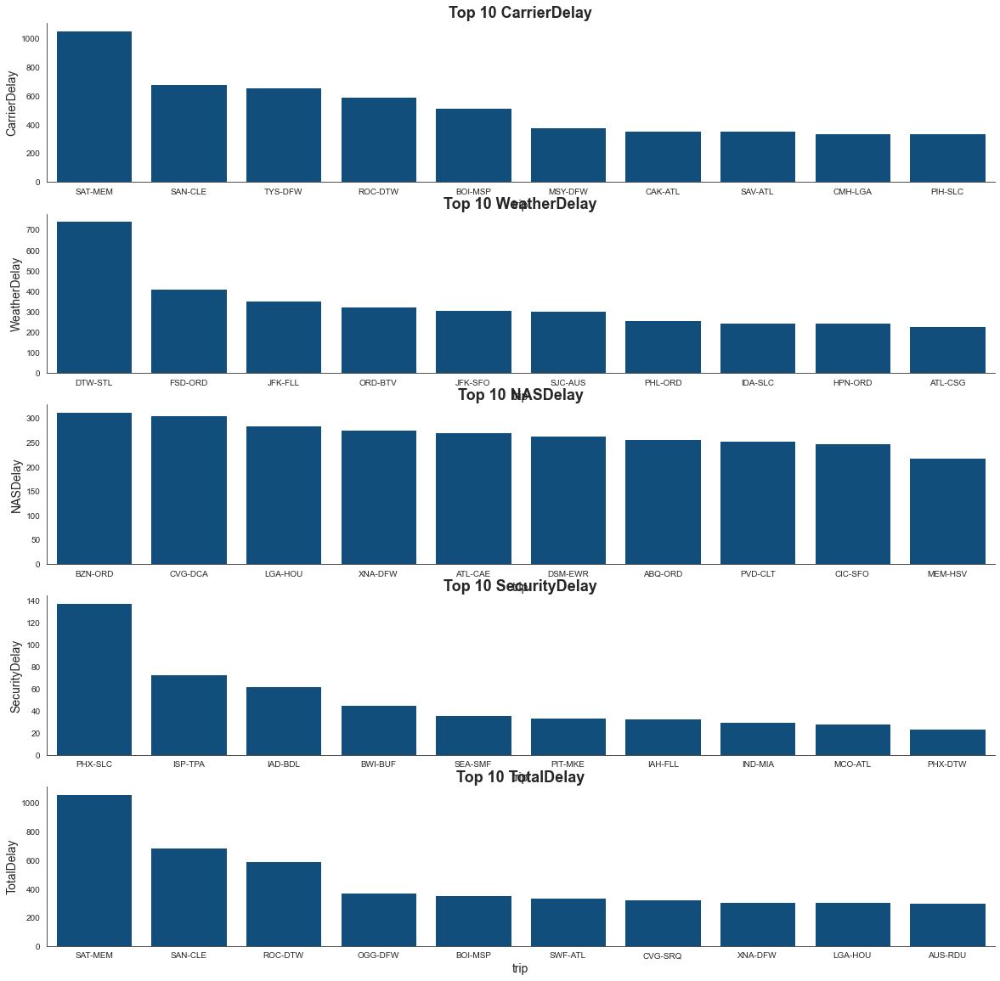

In [30]:
cols = ['CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay','TotalDelay']
fig, ax = plt.subplots(nrows=5, figsize = [20,20])

for i, col in enumerate(cols):
    df_loop=trip_groups.sort_values(col,ascending=False)[:10]
    sb.barplot(data=df_loop,x='trip',y=col,color=base_color, ax=ax[i])
    sb.despine()
    ax[i].set_title('Top 10 ' + col ,fontdict=title_font_dict)
    ax[i].set_xlabel(ax[i].get_xlabel(),fontdict=labels_font_dict)
    ax[i].set_ylabel(ax[i].get_ylabel(),fontdict=labels_font_dict)



# Trips median Delayed 

>Identify Top 10 trips with delays using Median to avoid extremes in data points

In [31]:
trip_groups_median=df[['trip','CarrierDelay','WeatherDelay','NASDelay','SecurityDelay','TotalDelay']].groupby('trip').median()
trip_groups_median

,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,TotalDelay
trip,,,,,
ABE-ATL,NaN,30.5,32.0,NaN,46.5
ABE-CLE,NaN,NaN,NaN,NaN,NaN
ABE-CLT,NaN,NaN,NaN,NaN,NaN
ABE-CVG,11.0,NaN,8.0,NaN,19.0
ABE-DTW,NaN,NaN,17.0,NaN,17.0
ABE-IAD,NaN,NaN,NaN,NaN,NaN
ABE-ORD,NaN,NaN,NaN,NaN,NaN
ABE-PHL,NaN,NaN,NaN,NaN,NaN
ABI-DFW,NaN,137.0,86.0,NaN,223.0


In [32]:
trip_groups_median.columns

Index(['CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay',
       'TotalDelay'],
      dtype='object')

In [33]:
trip_groups_median = trip_groups_median.reset_index()
trip_groups_median.columns = ['trip','CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay','TotalDelay']

In [34]:
trip_groups_median = trip_groups_median.dropna(axis=0, how='all')
trip_groups_median

,trip,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,TotalDelay
0,ABE-ATL,NaN,30.5,32.0,NaN,46.5
1,ABE-CLE,NaN,NaN,NaN,NaN,NaN
2,ABE-CLT,NaN,NaN,NaN,NaN,NaN
3,ABE-CVG,11.0,NaN,8.0,NaN,19.0
4,ABE-DTW,NaN,NaN,17.0,NaN,17.0
5,ABE-IAD,NaN,NaN,NaN,NaN,NaN
6,ABE-ORD,NaN,NaN,NaN,NaN,NaN
7,ABE-PHL,NaN,NaN,NaN,NaN,NaN
8,ABI-DFW,NaN,137.0,86.0,NaN,223.0
9,ABI-IAH,NaN,NaN,NaN,NaN,NaN


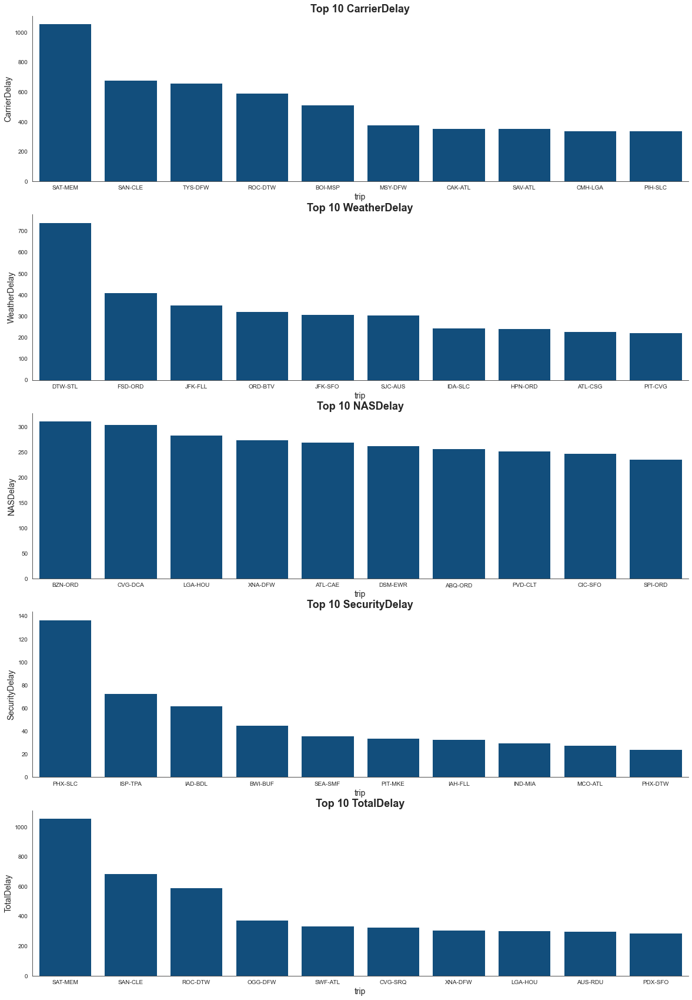

In [35]:

cols = ['CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay','TotalDelay']
fig, ax = plt.subplots(nrows=5, figsize = [20,30])

for i, col in enumerate(cols):
    df_loop=trip_groups_median.sort_values(col,ascending=False)[:10]
    sb.barplot(data=df_loop,x='trip',y=col,color=base_color, ax=ax[i])
    sb.despine()
    ax[i].set_title('Top 10 ' + col ,fontdict=title_font_dict)
    ax[i].set_xlabel(ax[i].get_xlabel(),fontdict=labels_font_dict)
    ax[i].set_ylabel(ax[i].get_ylabel(),fontdict=labels_font_dict)



C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


<function matplotlib.pyplot.show(*args, **kw)>

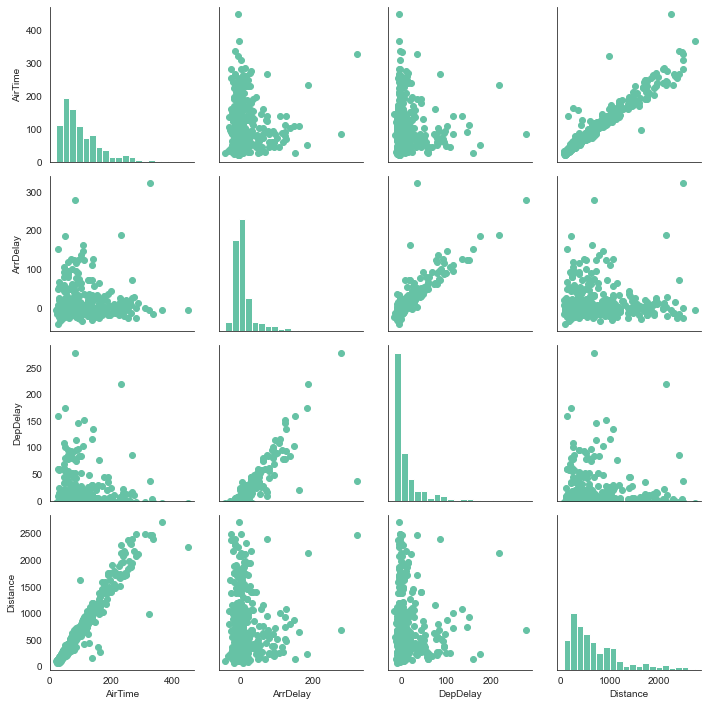

In [38]:
# plot matrix: sample 500 datapoint so that plots are clearer and
# they render faster
samples = np.random.choice(df.shape[0], 500, replace = False)
df_samp = df.iloc[samples,:]

g = sb.PairGrid(data = df_samp, vars = numeric_vars)
g = g.map_diag(plt.hist, bins = 20);
g.map_offdiag(plt.scatter)
plt.ylim(bottom=0)
plt.show



###  How did the feature(s) of interest vary with other features in the dataset?

> Air Time have outlier with distance taken need more detailed invistigation.

### Interesting relationships between the other features (not the main feature(s) of interest)?

> Departure Delay having outliers with Arrival delay correlations

## Multivariate Exploration


In [39]:
trip_groups_years=df[['Year','trip','CarrierDelay','WeatherDelay','NASDelay','SecurityDelay','TotalDelay']]\
                                                             .groupby(['Year','trip']).median().reset_index()
trip_groups_years

,Year,trip,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,TotalDelay
0,2003,ABE-ATL,NaN,NaN,15.0,NaN,15.0
1,2003,ABE-CLE,NaN,NaN,NaN,NaN,NaN
2,2003,ABE-CLT,NaN,NaN,NaN,NaN,NaN
3,2003,ABE-DTW,NaN,NaN,NaN,NaN,NaN
4,2003,ABE-IAD,NaN,NaN,NaN,NaN,NaN
5,2003,ABI-DFW,NaN,NaN,NaN,NaN,NaN
6,2003,ABQ-AMA,NaN,NaN,NaN,NaN,NaN
7,2003,ABQ-ATL,NaN,NaN,NaN,NaN,NaN
8,2003,ABQ-CVG,76.0,NaN,NaN,NaN,76.0
9,2003,ABQ-DAL,NaN,NaN,NaN,NaN,NaN


In [40]:
most_delayed = list(trip_groups_median.sort_values('TotalDelay',ascending=False)[:10]['trip'])
most_delayed

['SAT-MEM',
 'SAN-CLE',
 'ROC-DTW',
 'OGG-DFW',
 'SWF-ATL',
 'CVG-SRQ',
 'XNA-DFW',
 'LGA-HOU',
 'AUS-RDU',
 'PDX-SFO']

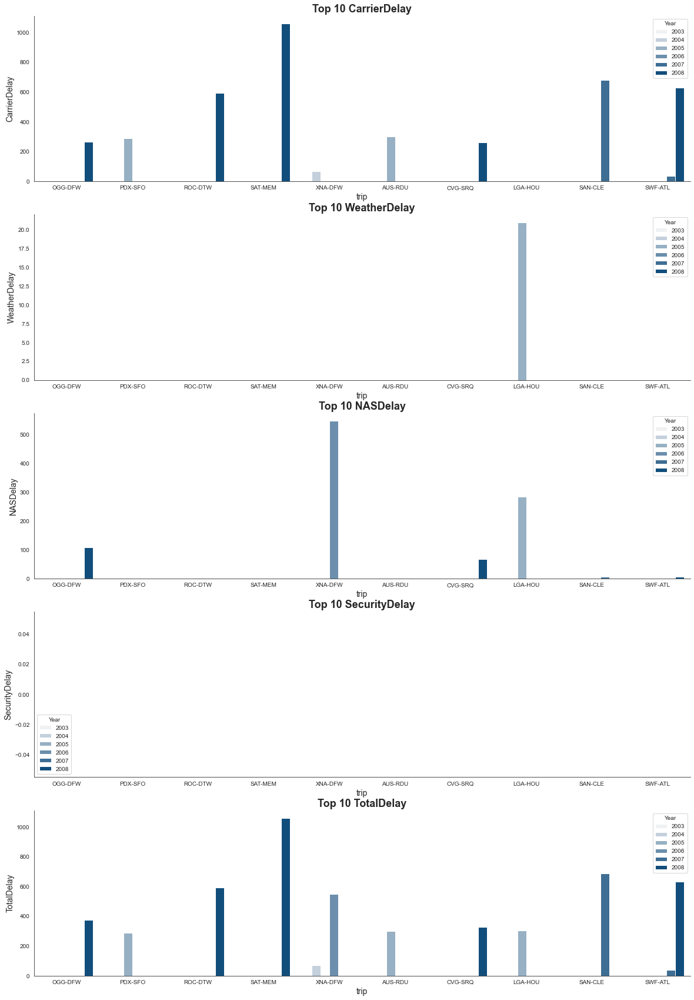

In [45]:
# Trying to explore the top 10 trips per delay reason,and allocate them with diffrent years,(Origin-Destination)
#to check if their are specific trips having always delays over years
cols = ['CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay','TotalDelay']
fig, ax = plt.subplots(nrows=5, figsize = [20,30])

df_loop=trip_groups_years.query('trip in @most_delayed')
for i, col in enumerate(cols):
    sb.barplot(data=df_loop,x='trip',y=col, hue='Year', color=base_color, ax=ax[i])
    sb.despine()
    ax[i].set_title('Top 10 ' + col ,fontdict=title_font_dict)
    ax[i].set_xlabel(ax[i].get_xlabel(),fontdict=labels_font_dict)
    ax[i].set_ylabel(ax[i].get_ylabel(),fontdict=labels_font_dict)



>This clearly showes that thetop 10 delayedtrips overall years,are not mandatory to be the top 10 every year.

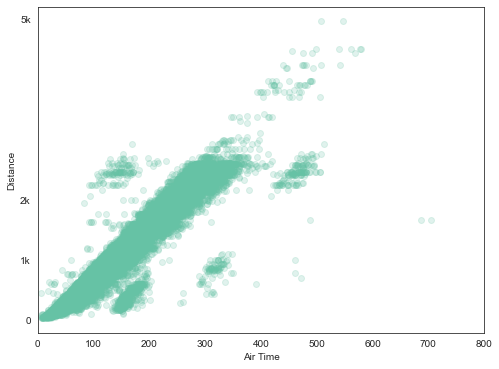

In [42]:
plt.figure(figsize = [8, 6])
plt.scatter(data = df, x = 'AirTime', y = 'Distance', alpha = 1/5)
plt.xlim([0, 800])
plt.xlabel('Air Time')
plt.yscale('Linear')
plt.yticks([0, 1e3, 2e3, 5e3], [0, '1k', '2k', '5k'])
plt.ylabel('Distance')
plt.show()

> The above correlation shows as Distance increases the Airtime increases with outliers that may need more investigation.

### Talk about some of the relationships you observed in this part of the investigation. Were there features that strengthened each other in terms of looking at your feature(s) of interest?

> The Top 10 trips having delays are not the same trips over the years
>Most delayed reason over the years is the carrier delay.

### Were there any interesting or surprising interactions between features?

> Although Airtime expected to be linear positive correlation with distance ,their are outliers that may need more invistagation.

> Once you're ready to finish your presentation, check your output by using
nbconvert to export the notebook and set up a server for the slides. From the
terminal or command line, use the following expression:
> > `jupyter nbconvert <file_name>.ipynb --to slides --post serve --template output_toggle`

> This should open a tab in your web browser where you can scroll through your
presentation. Sub-slides can be accessed by pressing 'down' when viewing its parent
slide. Make sure you remove all of the quote-formatted guide notes like this one
before you finish your presentation!